In [48]:
import dlib, cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.patheffects as path_effects
from genericpath import isfile
from PIL import Image

IMAGE_SIZE = 96,96

detector = dlib.get_frontal_face_detector()
sp = dlib.shape_predictor('models/shape_predictor_68_face_landmarks.dat')
facerec = dlib.face_recognition_model_v1('models/dlib_face_recognition_resnet_model_v1.dat')

In [51]:
class FaceDetector():
    def getdirs(self,dir):
            dirs = []
            for f in os.listdir(dir):
                f=os.path.join(dir,f)
                if os.path.isdir(f):
                    if not f.startswith('.'):
                        dirs.append(f)

            return dirs

    def getfiles(self,src_dir):
            files = []
            for f in os.listdir(src_dir):
                if isfile(os.path.join(src_dir,f)):
                    if not f.startswith('.'):
                     files.append(os.path.join(src_dir,f))

            return files


    def find_faces(self,img):
        dets = detector(img, 1)

        if len(dets) == 0:
            return np.empty(0), np.empty(0), np.empty(0)

        rects, shapes = [], []
        shapes_np = np.zeros((len(dets), 68, 2), dtype=np.int)
        for k, d in enumerate(dets):
            rect = ((d.left(), d.top()), (d.right(), d.bottom()))
            rects.append(rect)

            shape = sp(img, d)

            # convert dlib shape to numpy array
            for i in range(0, 68):
                shapes_np[k][i] = (shape.part(i).x, shape.part(i).y)

            shapes.append(shape)

        return rects, shapes, shapes_np

    def encode_faces(self,img, shapes):
        face_descriptors = []
        for shape in shapes:
            face_descriptor = facerec.compute_face_descriptor(img, shape)
            face_descriptors.append(np.array(face_descriptor))

        return np.array(face_descriptors)

    def crop_faces_dir(self,src_dir,des_dir):
        path,folder_name = os.path.split(src_dir)
        label = folder_name

        files = self.getfiles(src_dir)
        cnt = 0
        num = 0
        for f in files:
            img_bgr = cv2.imread(f)
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

            rects, shapes, _ = self.find_faces(img_rgb)
            descriptors = self.encode_faces(img_rgb, shapes)

            fig, ax = plt.subplots(1, figsize=(20, 20))
            ax.imshow(img_rgb)

            for i, desc in enumerate(descriptors):
                image = Image.open(f)
                rect = patches.Rectangle(rects[i][0],
                                 rects[i][1][1] - rects[i][0][1],
                                 rects[i][1][0] - rects[i][0][0],
                                 linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                area = (rects[i][0][0],rects[i][0][1],rects[i][1][0],rects[i][1][1],)
                #print(rects[i])
                crop = image.crop(area)
                im = crop.resize(IMAGE_SIZE,Image.ANTIALIAS)
                im.save(des_dir+'/'+'_'+label+str(cnt)+'_'+str(i)+".png")
            
            print('### Image Num  '+ str(cnt) + '  Complete'+' ###')
            cnt = cnt + 1
            #plt.axis('off')
            #plt.savefig('result/output.png')
            #plt.show()
    def crop_faces_rootdir(self,src_dir,des_dir):
        dirs = self.getdirs(src_dir)
        #list sub directory
        for d in dirs:
            print('### Starting cropping in directory %s ###'%d)
            self.crop_faces_dir(d, des_dir)



### Starting cropping in directory img\old ###
### CNT  1  Complete ###
### CNT  2  Complete ###
### CNT  3  Complete ###
### CNT  4  Complete ###
### CNT  5  Complete ###
### CNT  6  Complete ###
### CNT  7  Complete ###
### CNT  8  Complete ###
### CNT  9  Complete ###
### CNT  10  Complete ###
### CNT  11  Complete ###
### CNT  12  Complete ###
### CNT  13  Complete ###
### CNT  14  Complete ###
### CNT  15  Complete ###
### CNT  16  Complete ###
### CNT  17  Complete ###
### CNT  18  Complete ###
### CNT  19  Complete ###
### CNT  20  Complete ###
### CNT  21  Complete ###


C:\Users\baky\anaconda3\lib\site-packages\ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


### CNT  22  Complete ###
### CNT  23  Complete ###
### CNT  24  Complete ###
### CNT  25  Complete ###


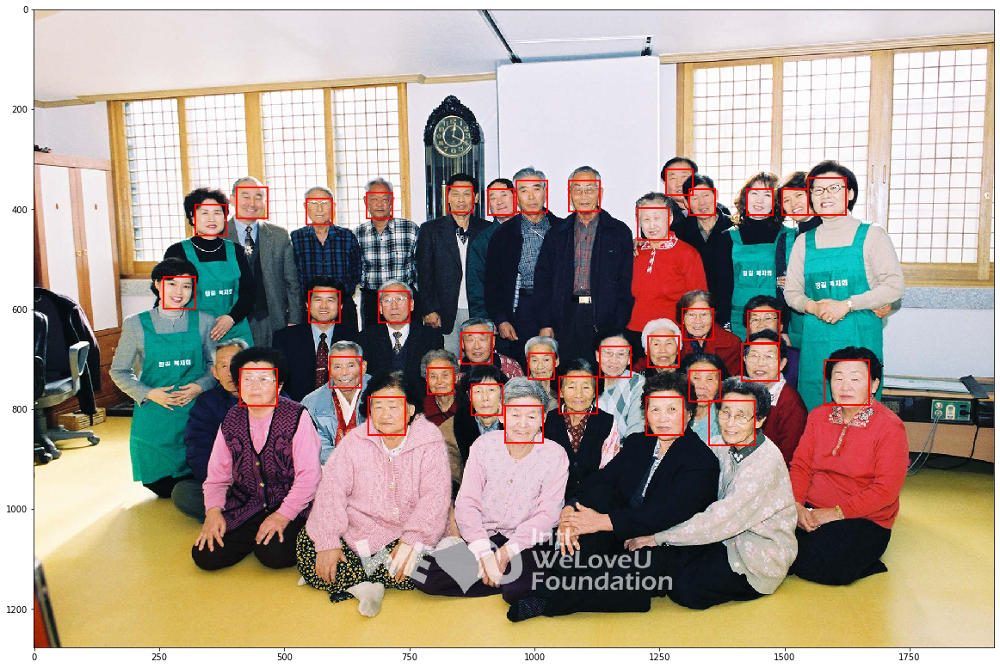

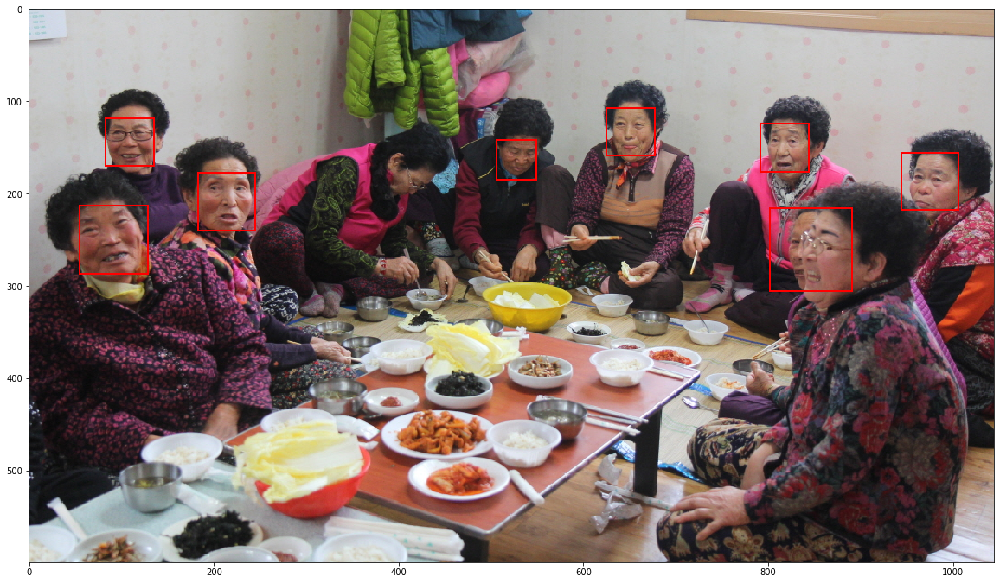

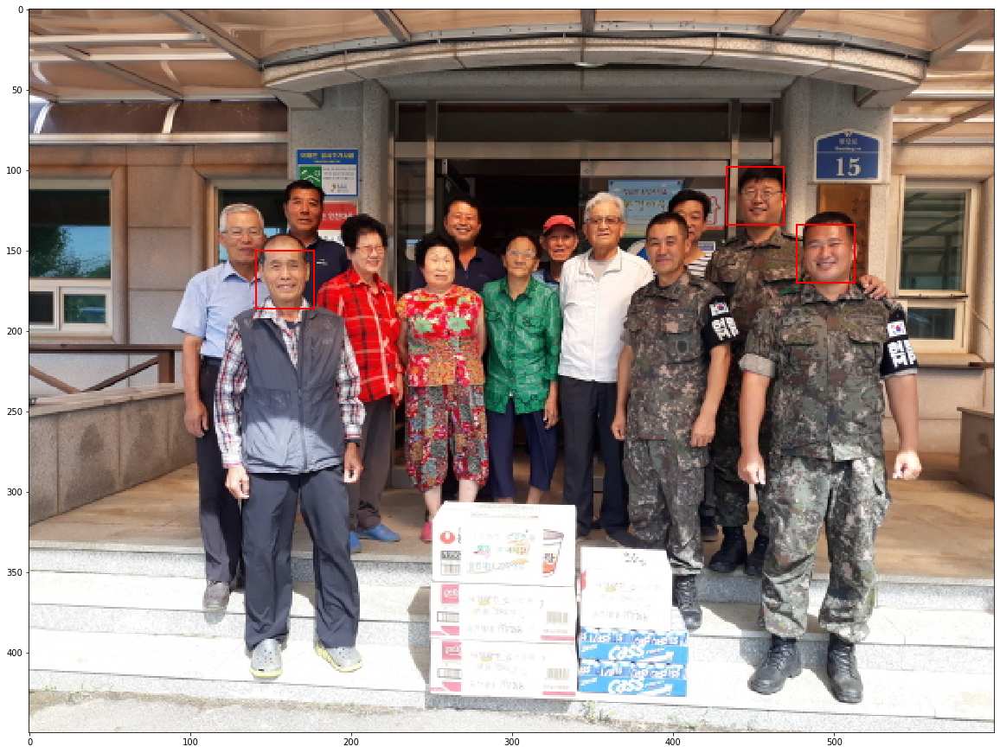

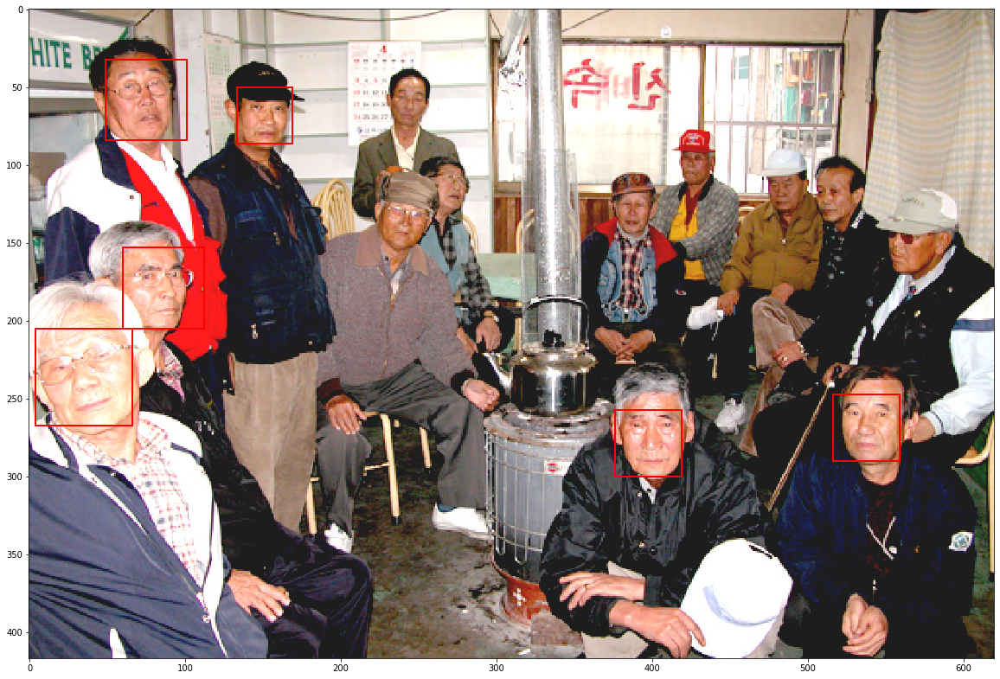

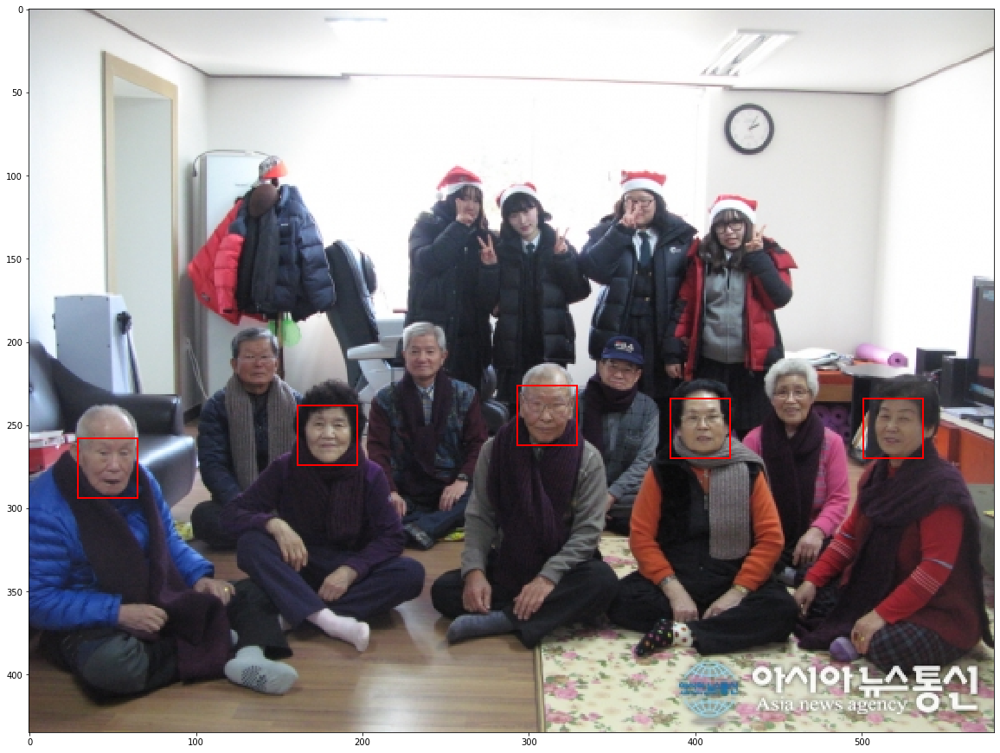

...

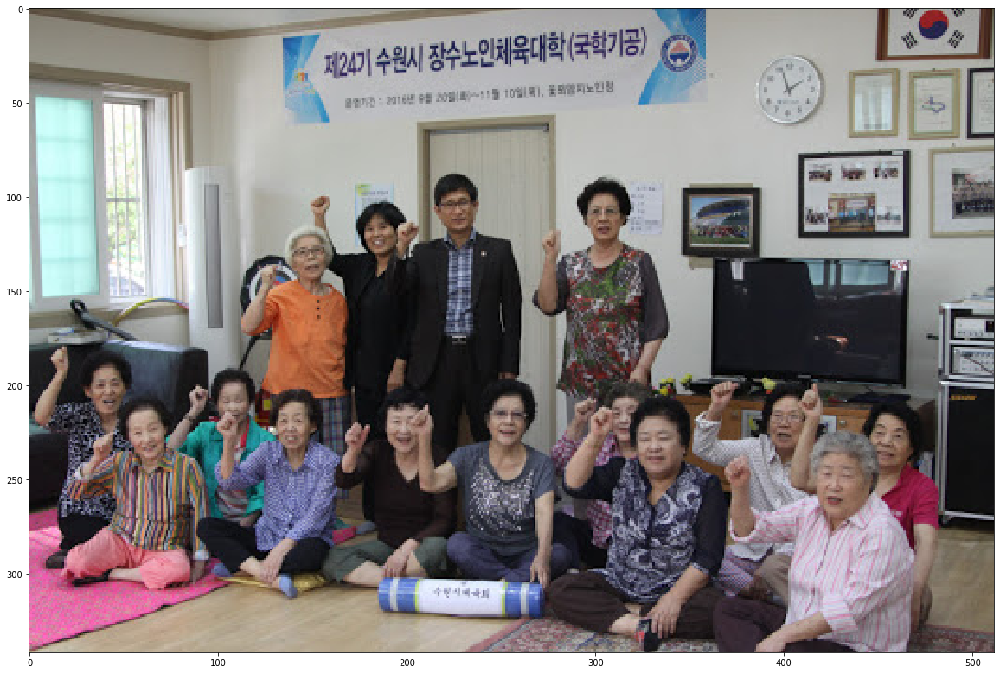

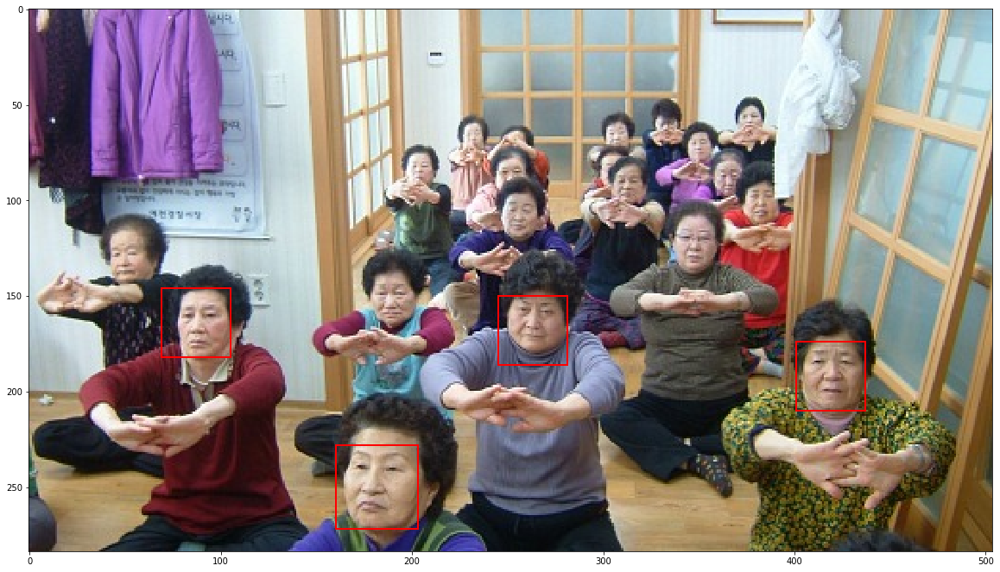

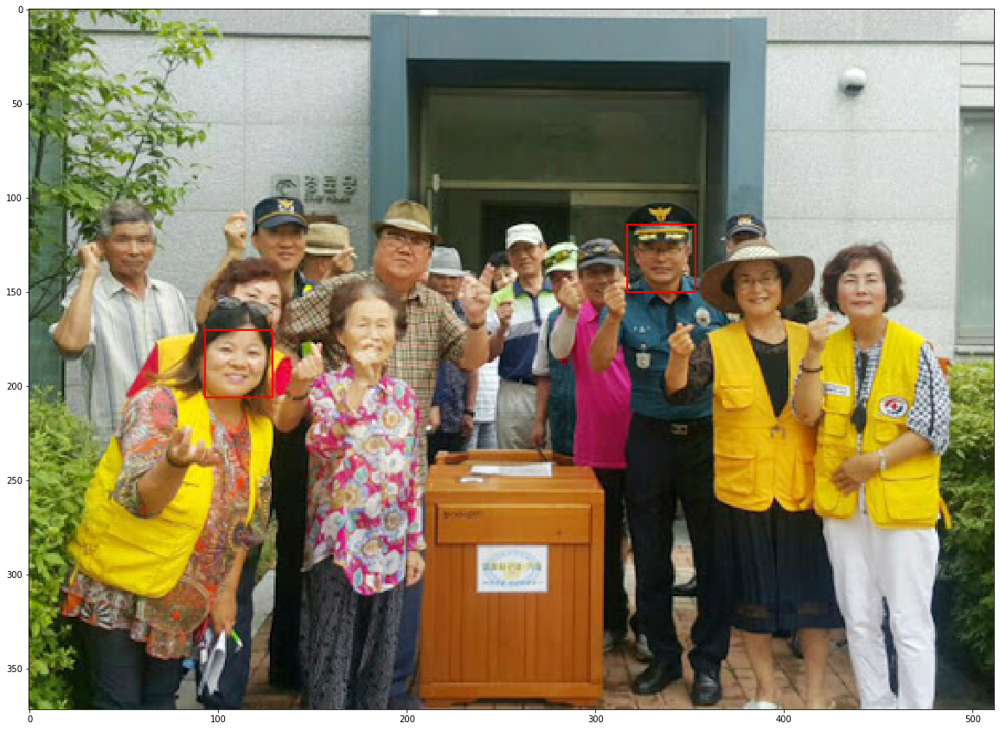

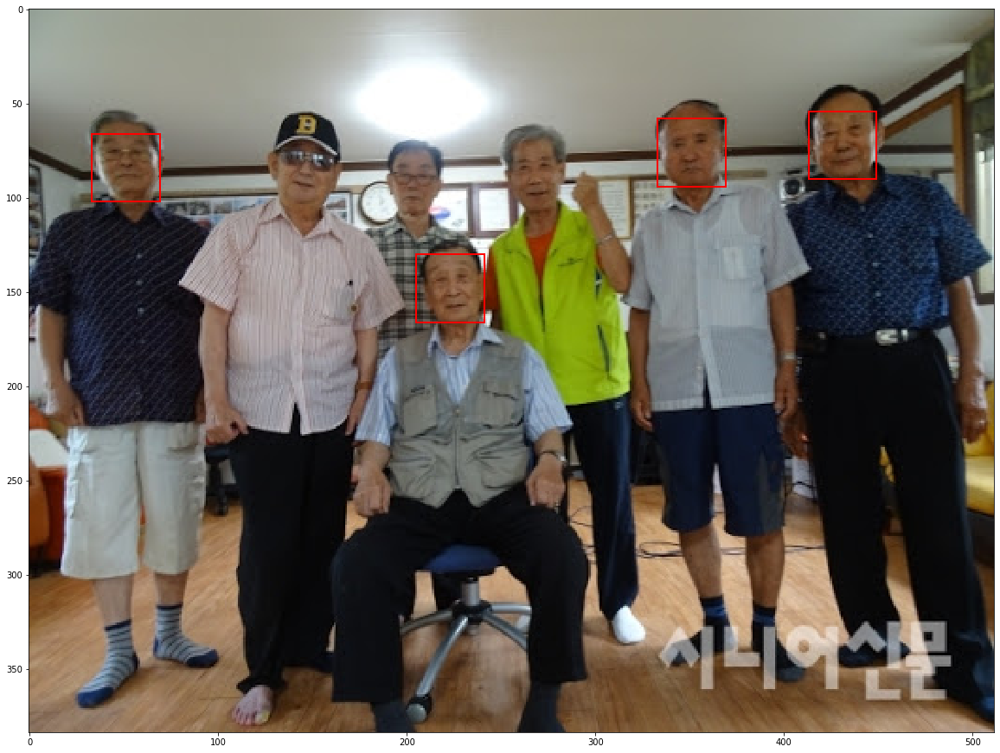

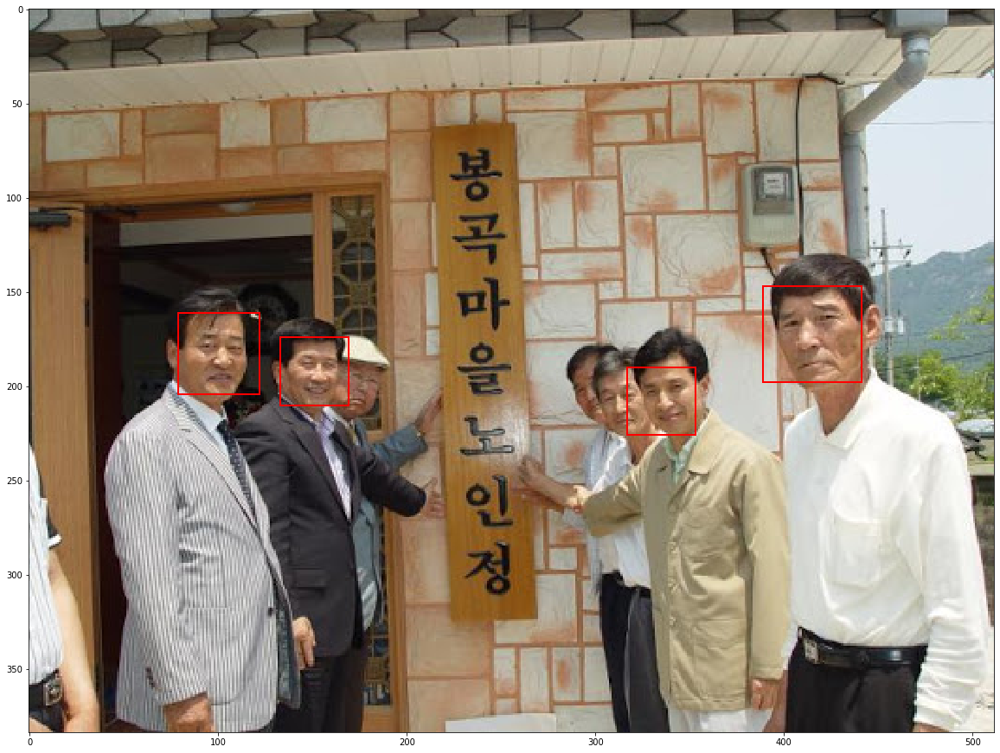

In [52]:

#메인

srcdir= 'img'
desdir = 'result'
    #폴더에서 파일 불러오기
    
det = FaceDetector()
det.crop_faces_rootdir(srcdir, desdir)
